<a href="https://colab.research.google.com/github/stasrodov/mountune/blob/main/mountune_project.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# MountTune
# Introduction To Computational And Biological Vision, BGU
# Final Project
---
Stas Rodov     <br>
Amos Haviv Hason

In [ ]:
!pip install MIDIUtil==1.2.1
!pip install musical-scales==1.0.1

In [ ]:
import cv2
import matplotlib.pyplot as plt
import numpy as np
import imutils as iutl
import musical_scales
from midiutil.MidiFile import MIDIFile

## From Photos

In [ ]:
'''
An image-loading auxiliary method.
In order to run MountTune on a certain image for the first time, first drag the
file to the "Files" section of the notebook, then use code snippet below ("For
-image loading testing") to load and show the image, and use the visual result
to consider adjusting image_load() to crop the image, so that the shown image
will capture the area of interest (the mountain) with as minimum as possible
bacground included, see existing examples.
MountTune will run faster and results will be more precise.
'''
def image_load(filename):
  if filename == 'ICBV231-2-mnt0.jpeg':
    img = cv2.imread(filename)[:500, :]
  elif filename == 'ICBV231-2-mnt1.jpeg':
    img = cv2.imread(filename)[152:, :]
  elif filename == 'ICBV231-2-mnt2.jpeg':
    img = cv2.imread(filename)[250:, :]
  elif filename == 'ICBV231-2-mnt4.jpeg':
    img = cv2.imread(filename)[150:600, :]
  elif filename == 'ICBV231-2-mnt6.jpeg':
    img = cv2.imread(filename)[:300, :]
  elif filename == 'ICBV231-2-mnt8.jpeg':
    img = cv2.imread(filename)[385:585, :]
  elif filename == 'ICBV231-2-mnt9.jpeg':
    img = cv2.imread(filename)[70:, :]
  elif filename == 'ICBV231-2-mnt10.jpeg':
    img = cv2.imread(filename)[150:450, :]
  elif filename == 'ICBV231-2-mnt13.jpeg':
    img = cv2.imread(filename)[183:700, :]
  elif filename == 'ICBV231-2-mnt14.jpeg':
    img = cv2.imread(filename)[153:550, :]
  elif filename == 'ICBV231-2-mnt14_msk.jpg':
    img = cv2.imread(filename, cv2.IMREAD_GRAYSCALE)[153:550, :]
  elif filename == 'ICBV231-2-mnt17.jpeg':
    img = cv2.imread(filename)[183:750, :]
  elif filename == 'ICBV231-2-mnt17_msk.jpg':
    img = cv2.imread(filename, cv2.IMREAD_GRAYSCALE)[183:750, :]
  elif filename == 'ICBV231-2-mnt21.jpeg':
    img = cv2.imread(filename)[110:950, :]
  elif filename == 'ICBV231-2-mnt21_msk.jpg':
    img = cv2.imread(filename, cv2.IMREAD_GRAYSCALE)[110:950, :]
  elif filename == 'ICBV231-2-mnt22.jpeg':
    img = cv2.imread(filename)[210:800, :]
  elif filename == 'ICBV231-2-mnt25.jpeg':
    img = cv2.imread(filename)[400:850, :]
  elif filename == 'ICBV231-2-mnt26.jpeg':
    img = cv2.imread(filename)[313:1000, :]
  elif filename == 'ICBV231-2-mnt30.jpeg':
    img = cv2.imread(filename)[100:800, 30:]
  elif filename == 'ICBV231-2-mnt31.jpeg':
    img = cv2.imread(filename)[360:900, :1750]
  else:
    img = cv2.imread(filename)
  return img


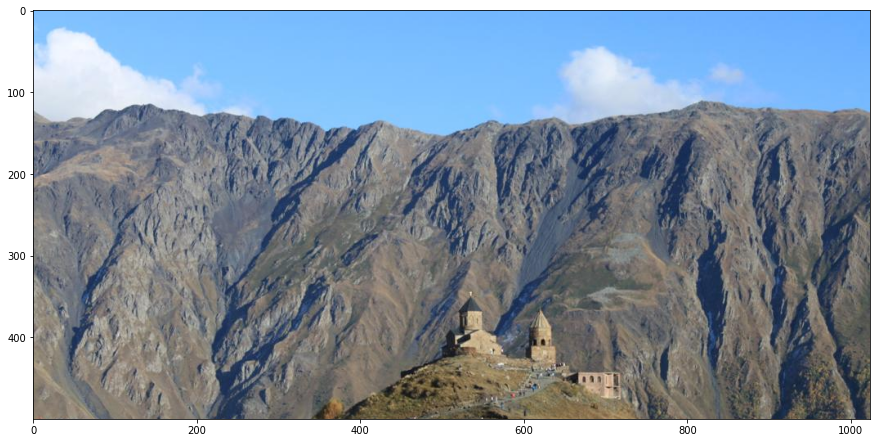

In [ ]:
'''
For image loading testing (see comment for image_load above):
'''
filename = 'ICBV231-2-mnt0.jpeg'
img0 = image_load(filename)
plt.imshow(cv2.cvtColor(img0, cv2.COLOR_BGR2RGB), figure=plt.figure(figsize=(15, 15)))


In [ ]:
# Auxiliary methods for extracting mountain contours:


white_pxl = 1 # foreground representation in the mask
black_pxl = 0 # background representation in the mask

def smoothed_sharpening(img):
  res = img.copy()
  kernel_shrp = np.array([[-1,-1,-1], [-1,9,-1], [-1,-1,-1]])
  res = cv2.bilateralFilter(res, 15, 25, 25)  # img = cv2.bilateralFilter(img, 15, 75, 75)
  res = cv2.filter2D(res, -1, kernel_shrp)
  res = cv2.GaussianBlur(res, (11, 11), 0)
  res = cv2.filter2D(res, -1, kernel_shrp)
  res = cv2.filter2D(res, -1, kernel_shrp)
  img = cv2.GaussianBlur(img, (5, 5), 0) #####
  return res


def extract_foreground_mask(img, mask_init=None, iter_count=5):
  height, width, _ = img.shape
  rect = (0, 1, width, height-1) if mask_init is None else None
  approx_mode = cv2.GC_INIT_WITH_RECT if mask_init is None else cv2.GC_INIT_WITH_MASK
  mask = np.zeros(img.shape[:2],np.uint8) if mask_init is None else mask_init
  bgdModel = np.zeros((1,65),np.float64)
  fgdModel = np.zeros((1,65),np.float64)
  mask_res, bgdModel, fgdModel = cv2.grabCut(img, mask, rect, bgdModel, fgdModel, iter_count, approx_mode)
  return np.where((mask_res == cv2.GC_PR_FGD)|(mask_res == cv2.GC_FGD), white_pxl, black_pxl).astype('uint8')


def approximate_contour(foreground_mask):
  contours = cv2.findContours(foreground_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)
  contours = iutl.grab_contours(contours)
  return max(contours, key=cv2.contourArea)


def filter_contour(contour):
  dict = {}
  for contour_pt in contour:
    if contour_pt[0] in dict:
      if contour_pt[1] < dict[contour_pt[0]]:
        dict[contour_pt[0]] = contour_pt[1]
    else:
      dict[contour_pt[0]] = contour_pt[1]
  return np.array([[key, dict[key]] for key in dict])


def plot_points_on_image(img, img_points, pt_color="red", pt_size=2, figsize=(20, 20)):
  plt.imshow(img, figure=plt.figure(figsize=figsize))
  plt.scatter(img_points[:, 0], img_points[:, 1], color=pt_color, s=pt_size)
  plt.show()


def create_init_mask(mask_curr, mask_user):
  mask_init = np.zeros(mask_curr.shape[:2], np.uint8)
  mask_init[:] = cv2.GC_PR_BGD               # all pixels EXCEPT from below 3 cases -> probable background
  mask_init[mask_curr == 1] = cv2.GC_PR_FGD  # white parts of mask_curr -> probable foreground
  mask_init[mask_user < 8] = cv2.GC_BGD      # black parts of mask_user -> ground truth background
  mask_init[mask_user > 246] = cv2.GC_FGD    # white parts of mask_user -> ground truth foreground
  return mask_init

In [ ]:
'''
Main method of extracting mountain contours
'''
def extract_mountain_contour(img, mask_init=None, gc_iter_count=5):
  # Sharpening the image keeping low noise:
  img_shrp = smoothed_sharpening(img)

  # Foreground mask extraction:
  mask_foreground0 = extract_foreground_mask(img_shrp, mask_init, gc_iter_count)

  # Smoothing the foreground mask:
  mask_foreground = cv2.GaussianBlur(mask_foreground0, (17, 17), 0)

  # Contour approximation of foreground mask:
  contour = approximate_contour(mask_foreground)
  contour_rshpd = np.reshape(contour, (contour.shape[0], contour.shape[2]))

  # Removing redundant points from contour:
  contour_rshpd_fltrd = filter_contour(contour_rshpd)

  return (contour_rshpd_fltrd, mask_foreground0)

## To music

In [ ]:
# Music generation related code:

CHROMATIC_SCALE_NOTES = tuple([x.name for x in musical_scales.scale('C', 'chromatic')][:-1])
RHYTMIC_BASE = 8
REMOVE_SEQUENTIAL_DUPLICATE_NOTES = True
STARTING_NOTE = 'D#'
SCALE_TYPE = 'ukranian dorian'  # Choose from list: https://pypi.org/project/musical-scales/
NUM_OCTAVES = 6
COMPRESSION_RATIO = 0.995
WINDOW_SIZE = 4
TONAL_BASE = len(CHROMATIC_SCALE_NOTES)
TEMPO = 540
VOLUME = 100


'''
Main method of music generation.
Note that the MIDI files will appear in the "Files" section of the notebook.
'''
def musify(summit_points, name='output'):
    midi_numbers, durations = get_midi_numbers_and_durations(summit_points)
    write_midi_file(midi_numbers, durations, name)


# Auxiliary methods:

def get_midi_numbers_and_durations(summit_points):
    relevant_notes = get_relevant_notes_according_to_scale()
    summit_heights = convert_summit_points_to_list_of_relative_heights_with_minimal_value_0_ordered_by_x_value(summit_points)
    durations = create_note_durations_using_1d_sobel_filter_with_minimal_threshold_0(summit_heights)
    durations = compress_values_by_max(durations, RHYTMIC_BASE) + 1
    summit_heights = summit_heights[2:-2]
    notes_as_integers = compress_values_by_max(summit_heights, len(relevant_notes) - 1)
    notes_as_integers, durations = average_over_window(notes_as_integers, durations)
    if REMOVE_SEQUENTIAL_DUPLICATE_NOTES:
        notes_as_integers, durations = remove_sequential_duplicate_notes_by_averaging_their_durations(notes_as_integers, durations)
    notes_as_integers_according_to_scale = [(relevant_notes[int(x)].name, relevant_notes[int(x)].octave) for x in notes_as_integers]
    midi_numbers = [note_to_midi_number(*x) for x in notes_as_integers_according_to_scale]

    return midi_numbers, durations


def get_relevant_notes_according_to_scale():
    relevant_notes = musical_scales.scale(STARTING_NOTE, SCALE_TYPE, octaves=NUM_OCTAVES)
    octave_offset = relevant_notes[0].octave
    for note in relevant_notes:
        note.octave = note.octave - octave_offset + 1

    return relevant_notes


def convert_summit_points_to_list_of_relative_heights_with_minimal_value_0_ordered_by_x_value(summit_points):
    notes_as_integers = [y[1] for y in sorted(summit_points, key=lambda x: x[0])]

    return [max(notes_as_integers) - x for x in notes_as_integers]


def create_note_durations_using_1d_sobel_filter_with_minimal_threshold_0(summit_heights):
    return np.abs(np.convolve(summit_heights, (-1, 0, 1), mode='same')[2:-2])


def compress_values_by_max(seq, max_):
    cur = np.array(seq)

    while round(np.max(cur)) > max_:
        cur = COMPRESSION_RATIO * cur

    return np.rint(cur)


def average_over_window(notes_as_integers_, durations_):
    modified_notes_as_integers = []
    modified_durations = []

    for w_start in range(0, len(notes_as_integers_), WINDOW_SIZE):
        w_end = min(w_start + WINDOW_SIZE, len(notes_as_integers_))
        modified_notes_as_integers.append(round(sum(notes_as_integers_[w_start:w_end]) / (w_end - w_start)))
        modified_durations.append(round(sum(durations_[w_start:w_end]) / (w_end - w_start)))

    return modified_notes_as_integers, modified_durations


def remove_sequential_duplicate_notes_by_averaging_their_durations(notes_as_integers_, durations_):
    modified_notes_as_integers = []
    modified_durations = []

    k = 0
    dup_durations = []
    prev = -1

    while k <= len(notes_as_integers_):
        if k == len(notes_as_integers_) or notes_as_integers_[k] != prev:
            if prev != -1:
                modified_notes_as_integers.append(prev)
                modified_durations.append(round(sum(dup_durations) / len(dup_durations)))

            if k < len(notes_as_integers_):
                prev = notes_as_integers_[k]
                dup_durations = [durations_[k]]

        else:
            dup_durations.append(durations_[k])

        k += 1

    return modified_notes_as_integers, modified_durations


def note_to_midi_number(note, octave):
    return TONAL_BASE + TONAL_BASE * octave + CHROMATIC_SCALE_NOTES.index(note)


def write_midi_file(midi_numbers, durations, name):
    midi = MIDIFile()
    midi.addTrackName(0, 0, '')
    midi.addTempo(0, 0, TEMPO)

    time = 0
    for i in range(len(midi_numbers)):
        midi.addNote(0, 0, midi_numbers[i], time, int(durations[i]), VOLUME)
        time = time + int(durations[i])

    with open(f'{name} {STARTING_NOTE} {SCALE_TYPE}.mid', 'wb') as f:
        midi.writeFile(f)



## Running MounTune from photos to music

### Without user input fix:

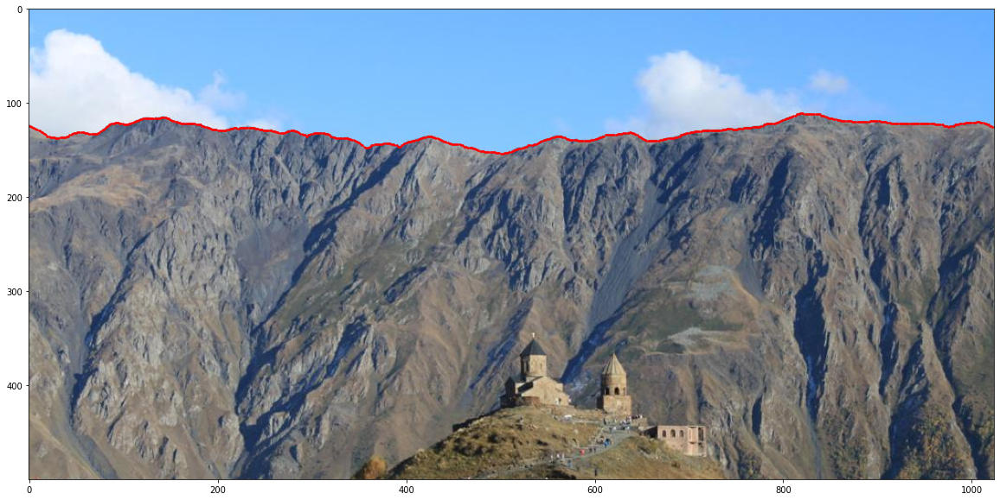

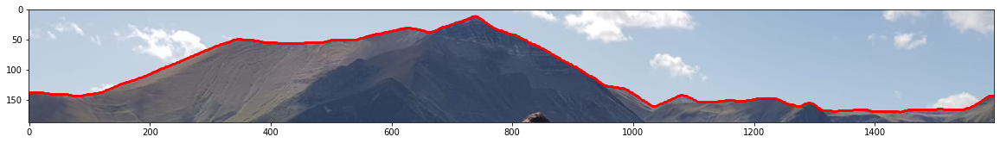

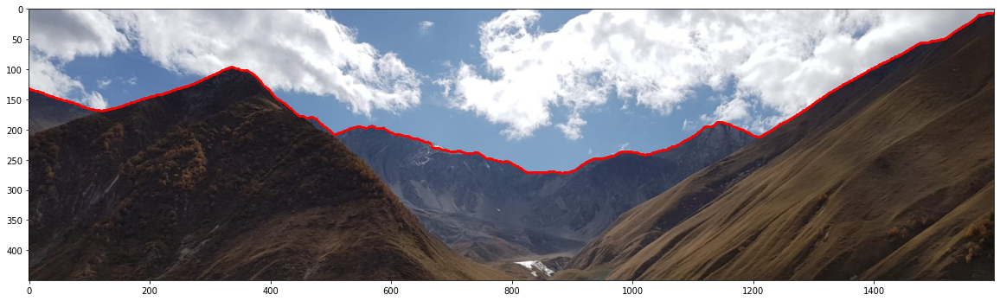

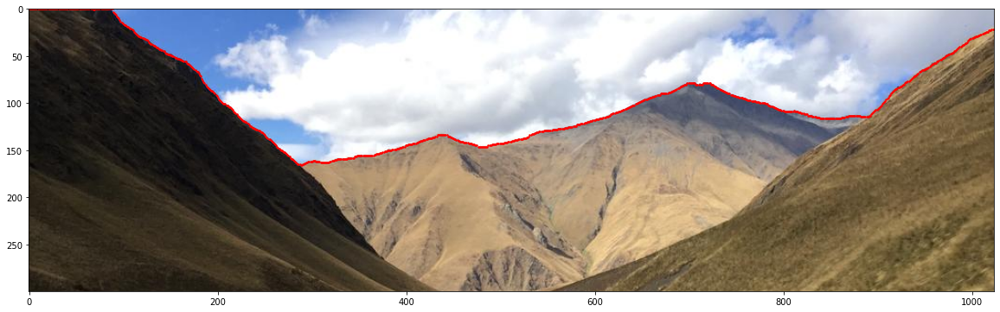

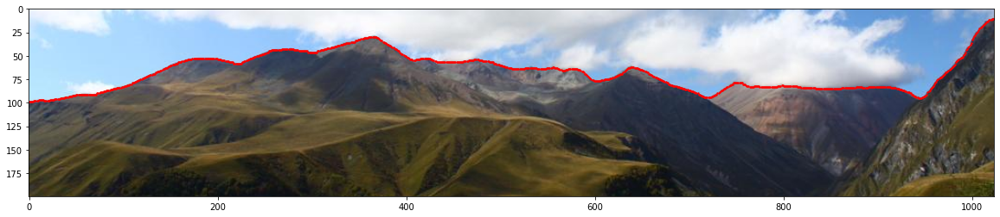

...

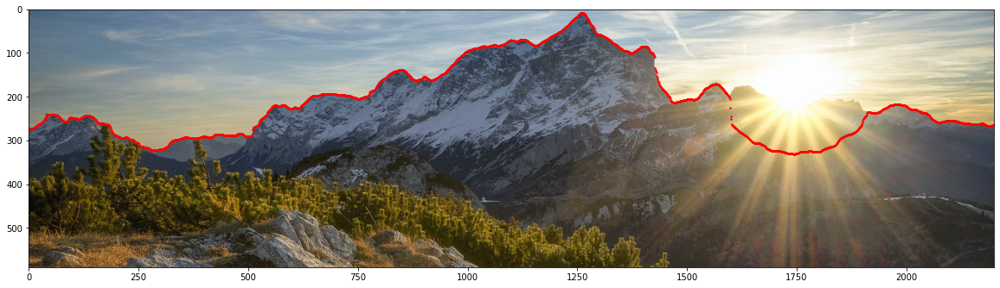

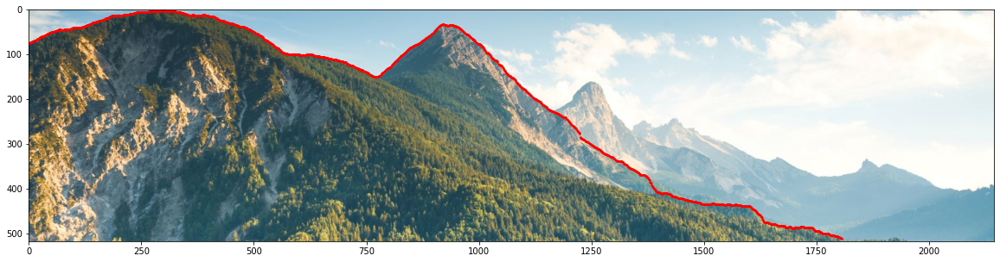

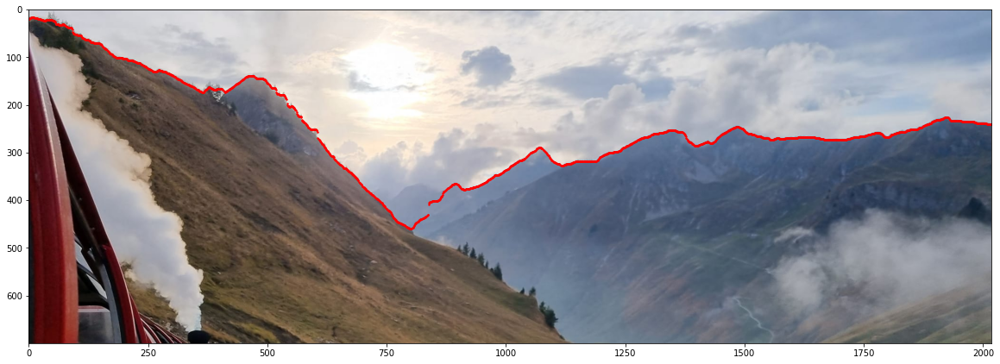

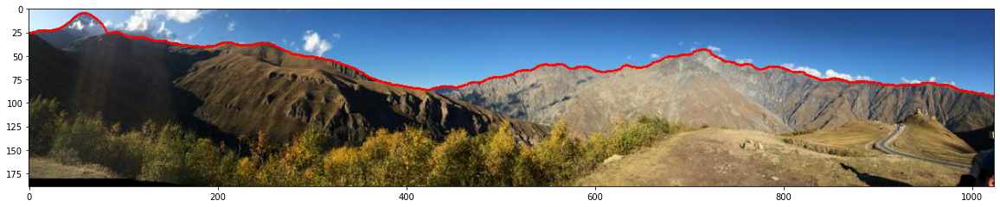

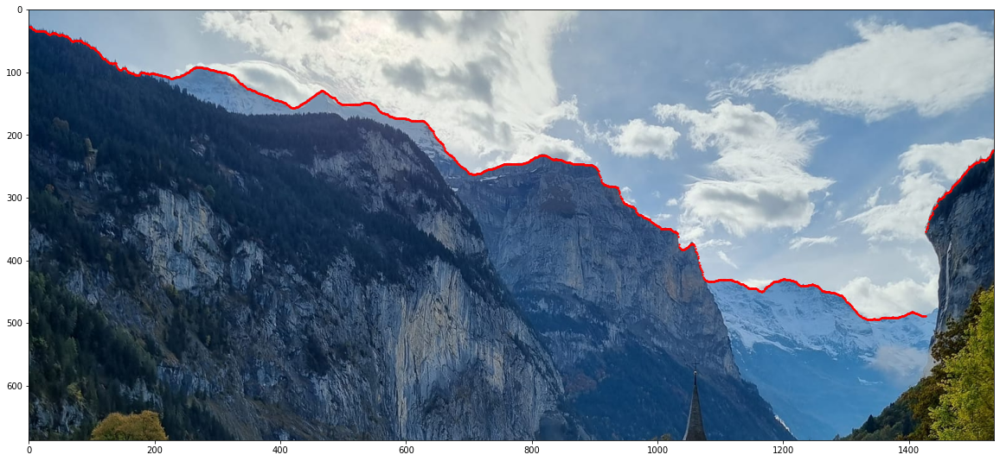

In [ ]:
# Note that the MIDI files will appear in the "Files" section of the notebook

filenames = ['ICBV231-2-mnt0.jpeg', 'ICBV231-2-mnt2.jpeg', 'ICBV231-2-mnt4.jpeg',
              'ICBV231-2-mnt6.jpeg', 'ICBV231-2-mnt8.jpeg', 'ICBV231-2-mnt10.jpeg',
              'ICBV231-2-mnt1.jpeg', 'ICBV231-2-mnt25.jpeg', 'ICBV231-2-mnt31.jpeg',
              'ICBV231-2-mnt22.jpeg', 'ICBV231-2-mnt13.jpeg','ICBV231-2-mnt30.jpeg',
              'ICBV231-2-mnt9.jpeg', 'ICBV231-2-mnt26.jpeg']

for filename in filenames:
  img = image_load(filename)
  mountn_contour, mask_foreground0 = extract_mountain_contour(img)
  plot_points_on_image(cv2.cvtColor(img.copy(), cv2.COLOR_BGR2RGB), mountn_contour)
  musify(mountn_contour, filename.split('.')[0])

### Examples of user input fix:

#### 1.

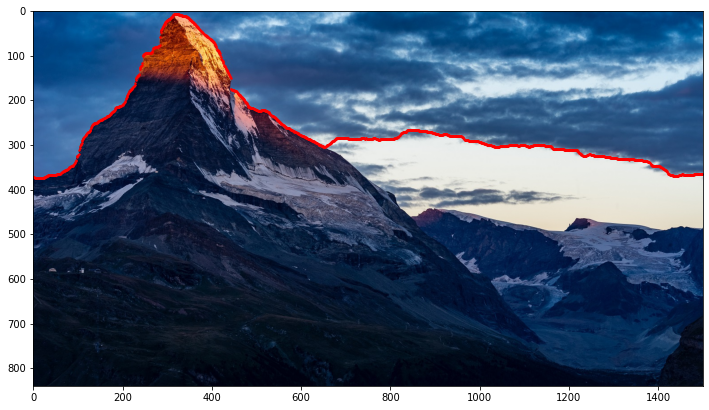

In [ ]:
filename = 'ICBV231-2-mnt21.jpeg'
img = image_load(filename)
mountn_contour, mask_foreground0 = extract_mountain_contour(img)
plot_points_on_image(cv2.cvtColor(img.copy(), cv2.COLOR_BGR2RGB), mountn_contour, figsize=(12, 12))

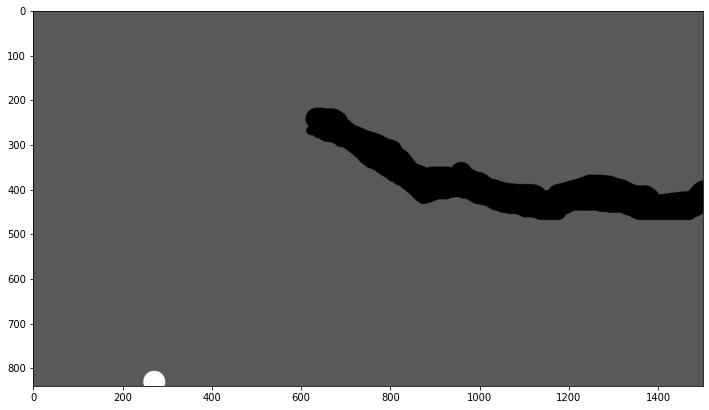

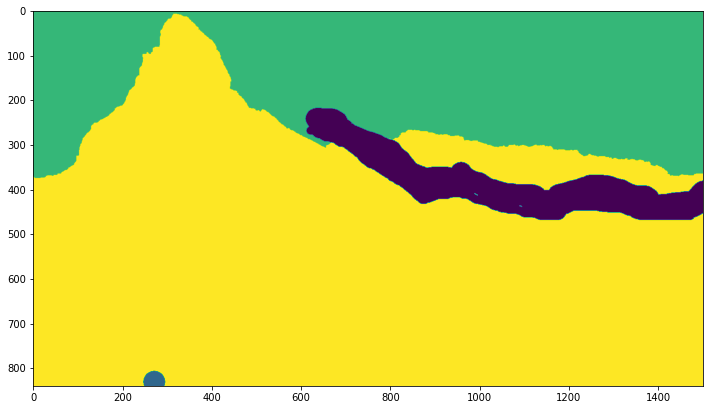

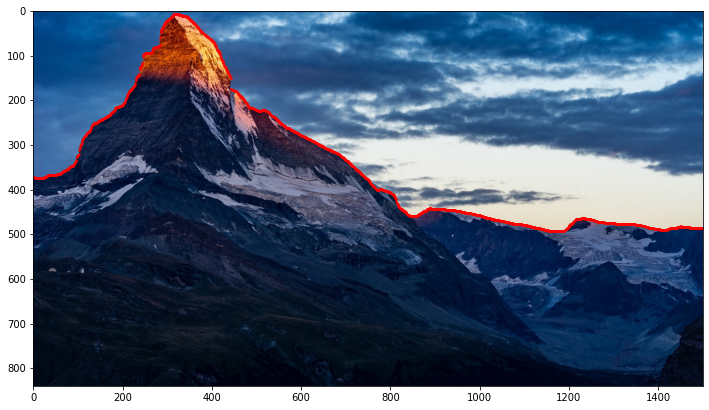

In [ ]:
# Loading user mask:
filename = 'ICBV231-2-mnt21_msk.jpg'
mask_user = image_load(filename)
plt.imshow(mask_user, cmap='gray', figure=plt.figure(figsize=(12, 12)))

# Creating init mask for next GrabCut run, by combining the result mask of
# previous GrabCut run together with user mask.
# The user mask represent a "fix" to the mask fom GrabCut:
mask_init = create_init_mask(mask_foreground0, mask_user)
plt.imshow(mask_init, figure=plt.figure(figsize=(12, 12)))

# Contour extraction using mask init:
mountn_contour_2, _ = extract_mountain_contour(img, mask_init)
plot_points_on_image(cv2.cvtColor(img.copy(), cv2.COLOR_BGR2RGB), mountn_contour_2, figsize=(12, 12))

#### 2.

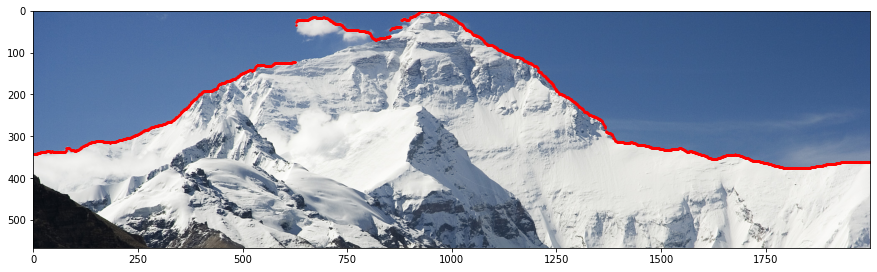

In [ ]:
filename = 'ICBV231-2-mnt17.jpeg'
img = image_load(filename)
mountn_contour, mask_foreground0 = extract_mountain_contour(img)
plot_points_on_image(cv2.cvtColor(img.copy(), cv2.COLOR_BGR2RGB), mountn_contour, figsize=(15, 15))

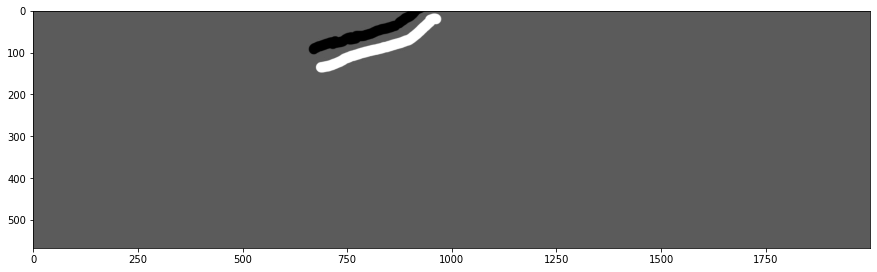

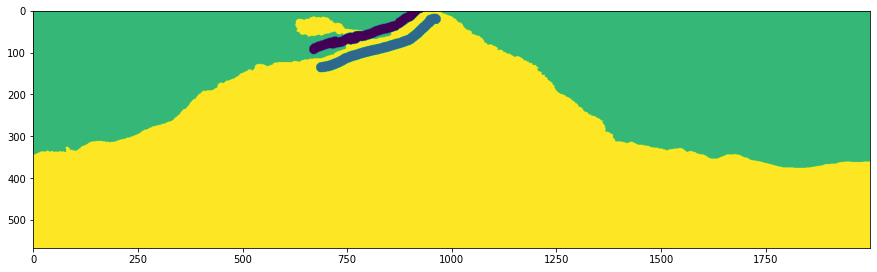

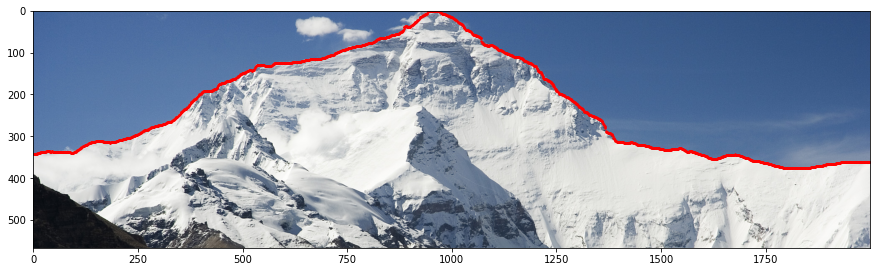

In [ ]:
# Loading user mask:
filename = 'ICBV231-2-mnt17_msk.jpg'
mask_user = image_load(filename)
plt.imshow(mask_user, cmap='gray', figure=plt.figure(figsize=(15, 15)))

# Creating init mask for next GrabCut run:
mask_init = create_init_mask(mask_foreground0, mask_user)
plt.imshow(mask_init, figure=plt.figure(figsize=(15, 15)))

# Contour extraction using mask init:
mountn_contour_2, _ = extract_mountain_contour(img, mask_init)
plot_points_on_image(cv2.cvtColor(img.copy(), cv2.COLOR_BGR2RGB), mountn_contour_2, figsize=(15, 15))

#### 3.

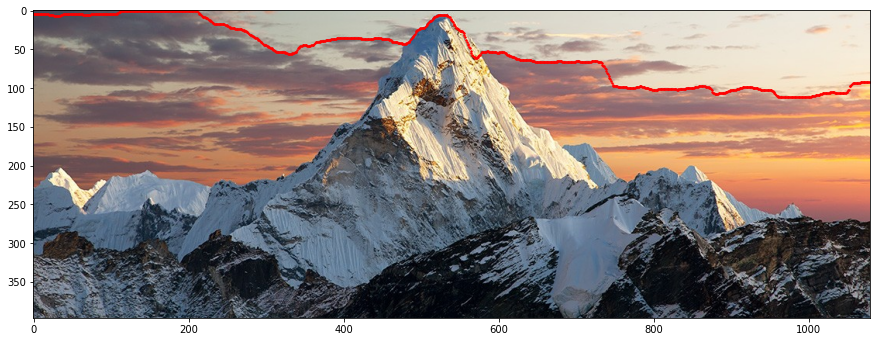

In [ ]:
filename = 'ICBV231-2-mnt14.jpeg'
img = image_load(filename)
mountn_contour, mask_foreground0 = extract_mountain_contour(img)
plot_points_on_image(cv2.cvtColor(img.copy(), cv2.COLOR_BGR2RGB), mountn_contour, figsize=(15, 15))

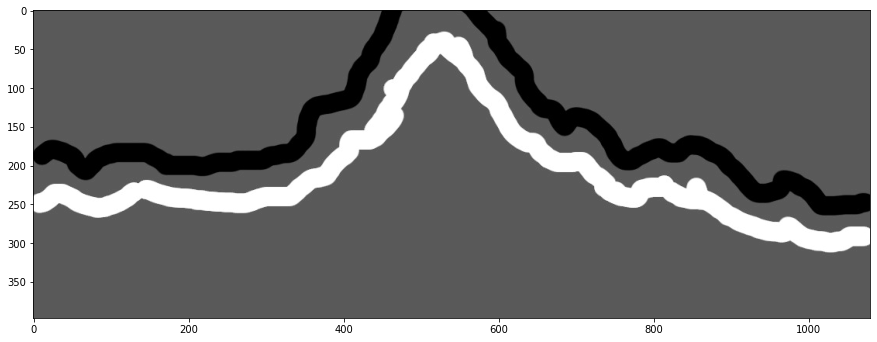

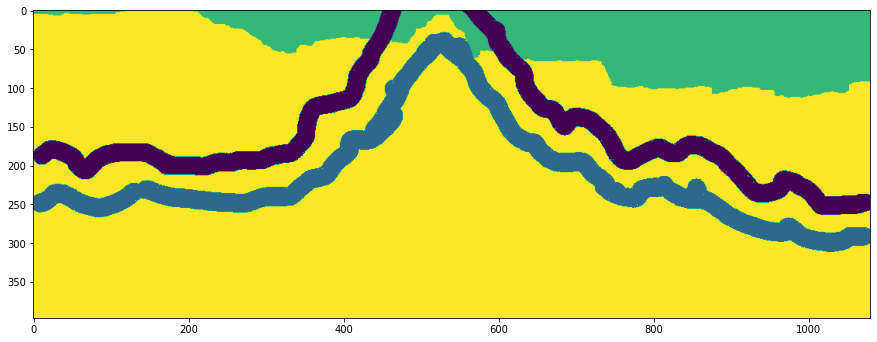

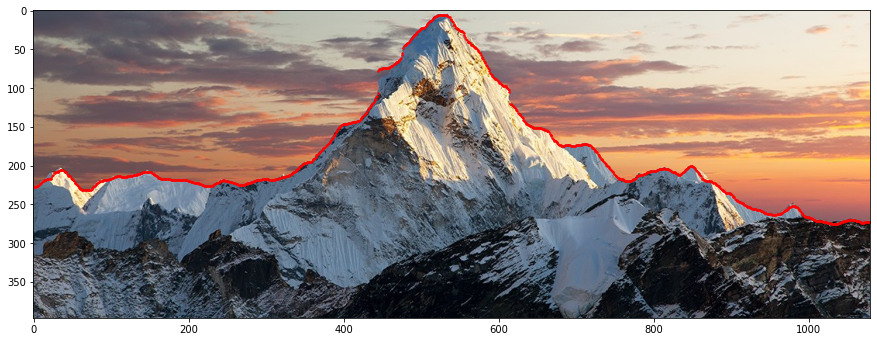

In [ ]:
# Loading user mask:
filename = 'ICBV231-2-mnt14_msk.jpg'
mask_user = image_load(filename)
plt.imshow(mask_user, cmap='gray', figure=plt.figure(figsize=(15, 15)))

# Creating init mask for next GrabCut run:
mask_init = create_init_mask(mask_foreground0, mask_user)
plt.imshow(mask_init, figure=plt.figure(figsize=(15, 15)))

# Contour extraction using mask init:
mountn_contour_2, _ = extract_mountain_contour(img, mask_init)
plot_points_on_image(cv2.cvtColor(img.copy(), cv2.COLOR_BGR2RGB), mountn_contour_2, figsize=(15, 15))